In [5]:
!gdown 1296LWeAvegIpat_-eTmtJGghwd2MHRJo

Downloading...
From: https://drive.google.com/uc?id=1296LWeAvegIpat_-eTmtJGghwd2MHRJo
To: /content/Speed Dating Data.csv
100% 5.19M/5.19M [00:00<00:00, 67.9MB/s]


In [6]:
import numpy as np
import pandas as pd
import statistics as stats
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import median_abs_deviation
from scipy.stats import variation
from scipy.stats import kurtosis
from scipy.stats import skew
from sklearn.impute import KNNImputer

data = pd.read_csv("Speed Dating Data.csv", encoding = "ISO-8859-1")
data

,iid,id,gender,idg,condtn,wave,round,position,positin1,order,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
0,1,1.0,0,1,1,1,10,7,NaN,4,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
1,1,1.0,0,1,1,1,10,7,NaN,3,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
2,1,1.0,0,1,1,1,10,7,NaN,10,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
3,1,1.0,0,1,1,1,10,7,NaN,5,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
4,1,1.0,0,1,1,1,10,7,NaN,7,...,5.0,7.0,7.0,7.0,7.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8373,552,22.0,1,44,2,21,22,14,10.0,5,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0
8374,552,22.0,1,44,2,21,22,13,10.0,4,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0
8375,552,22.0,1,44,2,21,22,19,10.0,10,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0
8376,552,22.0,1,44,2,21,22,3,10.0,16,...,8.0,5.0,7.0,6.0,7.0,9.0,5.0,9.0,5.0,6.0


In [7]:
fields = list(data.columns.values)
columns_ignore = ['iid', 'id', 'pid', 'idg', 'condtn', 'wave', 'round', 'position', 'positin1', 'order', 'partner']
fields

['iid',
 'id',
 'gender',
 'idg',
 'condtn',
 'wave',
 'round',
 'position',
 'positin1',
 'order',
 'partner',
 'pid',
 'match',
 'int_corr',
 'samerace',
 'age_o',
 'race_o',
 'pf_o_att',
 'pf_o_sin',
 'pf_o_int',
 'pf_o_fun',
 'pf_o_amb',
 'pf_o_sha',
 'dec_o',
 'attr_o',
 'sinc_o',
 'intel_o',
 'fun_o',
 'amb_o',
 'shar_o',
 'like_o',
 'prob_o',
 'met_o',
 'age',
 'field',
 'field_cd',
 'undergra',
 'mn_sat',
 'tuition',
 'race',
 'imprace',
 'imprelig',
 'from',
 'zipcode',
 'income',
 'goal',
 'date',
 'go_out',
 'career',
 'career_c',
 'sports',
 'tvsports',
 'exercise',
 'dining',
 'museums',
 'art',
 'hiking',
 'gaming',
 'clubbing',
 'reading',
 'tv',
 'theater',
 'movies',
 'concerts',
 'music',
 'shopping',
 'yoga',
 'exphappy',
 'expnum',
 'attr1_1',
 'sinc1_1',
 'intel1_1',
 'fun1_1',
 'amb1_1',
 'shar1_1',
 'attr4_1',
 'sinc4_1',
 'intel4_1',
 'fun4_1',
 'amb4_1',
 'shar4_1',
 'attr2_1',
 'sinc2_1',
 'intel2_1',
 'fun2_1',
 'amb2_1',
 'shar2_1',
 'attr3_1',
 'sinc3_1',
 

**Estadística descriptiva**

In [ ]:
descriptive_analysis = data.drop(columns = columns_ignore).describe()

descriptive_analysis

,gender,match,int_corr,samerace,age_o,race_o,pf_o_att,pf_o_sin,pf_o_int,pf_o_fun,...,attr3_3,sinc3_3,intel3_3,fun3_3,amb3_3,attr5_3,sinc5_3,intel5_3,fun5_3,amb5_3
count,8378.000000,8378.000000,8220.000000,8378.000000,8274.000000,8305.000000,8289.000000,8289.000000,8289.000000,8280.000000,...,3974.000000,3974.000000,3974.000000,3974.000000,3974.000000,2016.000000,2016.000000,2016.000000,2016.000000,2016.000000
mean,0.500597,0.164717,0.196010,0.395799,26.364999,2.756653,22.495347,17.396867,20.270759,17.459714,...,7.240312,8.093357,8.388777,7.658782,7.391545,6.810020,7.615079,7.932540,7.155258,7.048611
std,0.500029,0.370947,0.303539,0.489051,3.563648,1.230689,12.569802,7.044003,6.782895,6.085526,...,1.576596,1.610309,1.459094,1.744670,1.961417,1.507341,1.504551,1.340868,1.672787,1.717988
min,0.000000,0.000000,-0.830000,0.000000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,2.000000,3.000000,2.000000,1.000000,2.000000,2.000000,4.000000,1.000000,1.000000
25%,0.000000,0.000000,-0.020000,0.000000,24.000000,2.000000,15.000000,15.000000,17.390000,15.000000,...,7.000000,7.000000,8.000000,7.000000,6.000000,6.000000,7.000000,7.000000,6.000000,6.000000
50%,1.000000,0.000000,0.210000,0.000000,26.000000,2.000000,20.000000,18.370000,20.000000,18.000000,...,7.000000,8.000000,8.000000,8.000000,8.000000,7.000000,8.000000,8.000000,7.000000,7.000000
75%,1.000000,0.000000,0.430000,1.000000,28.000000,4.000000,25.000000,20.000000,23.810000,20.000000,...,8.000000,9.000000,9.000000,9.000000,9.000000,8.000000,9.000000,9.000000,8.000000,8.000000
max,1.000000,1.000000,0.910000,1.000000,55.000000,6.000000,100.000000,60.000000,50.000000,50.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,10.000000,10.000000,10.000000,10.000000,10.000000


In [ ]:
for column_name in fields:
  print("Mode of", column_name)
  calc_mode = data[column_name].mode()

  if len(calc_mode) > 1:
    print("Multiple modes")
    for m in calc_mode:
      print(m)
  else:
    print("Mode is:", calc_mode.values[0])

Mode of iid
Multiple modes
509
510
511
512
513
514
515
516
517
518
519
520
521
522
523
524
525
526
527
528
529
530
531
532
533
534
535
536
537
538
539
540
541
542
543
544
545
546
547
548
549
550
551
552
Mode of id
Multiple modes
1.0
2.0
6.0
Mode of gender
Mode is: 1
Mode of idg
Multiple modes
1
3
5
Mode of condtn
Mode is: 2
Mode of wave
Mode is: 21
Mode of round
Mode is: 18
Mode of position
Multiple modes
2
3
Mode of positin1
Multiple modes
2.0
3.0
4.0
Mode of order
Multiple modes
1
2
3
4
5
Mode of partner
Multiple modes
1
2
6
Mode of pid
Multiple modes
509.0
510.0
511.0
512.0
513.0
514.0
515.0
516.0
517.0
518.0
519.0
520.0
521.0
522.0
523.0
524.0
525.0
526.0
527.0
528.0
529.0
530.0
531.0
532.0
533.0
534.0
535.0
536.0
537.0
538.0
539.0
540.0
541.0
542.0
543.0
544.0
545.0
546.0
547.0
548.0
549.0
550.0
551.0
552.0
Mode of match
Mode is: 0
Mode of int_corr
Mode is: 0.31
Mode of samerace
Mode is: 0
Mode of age_o
Mode is: 27.0
Mode of race_o
Mode is: 2.0
Mode of pf_o_att
Mode is: 20.0
Mode 

In [ ]:
for column_name in fields:
  # Verify if the column is numeric type
  if pd.api.types.is_numeric_dtype(data[column_name]):
    calc_sum = data[column_name].sum()
    print("Sum of", column_name, "is:", calc_sum)
  else:
    print("Cannot calculate the sum of:", column_name)

Sum of iid is: 2376637
Sum of id is: 75060.0
Sum of gender is: 4194
Sum of idg is: 145167
Sum of condtn is: 15322
Sum of wave is: 95098
Sum of round is: 141354
Sum of position is: 75760
Sum of positin1 is: 60720.0
Sum of order is: 74796
Sum of partner is: 75097
Sum of pid is: 2375372.0
Sum of match is: 1380
Sum of int_corr is: 1611.2
Sum of samerace is: 3316
Sum of age_o is: 218144.0
Sum of race_o is: 22894.0
Sum of pf_o_att is: 186463.93
Sum of pf_o_sin is: 144202.63
Sum of pf_o_int is: 168024.32
Sum of pf_o_fun is: 144566.43
Sum of pf_o_amb is: 88378.74
Sum of pf_o_sha is: 97717.08
Sum of dec_o is: 3515
Sum of attr_o is: 50550.9
Sum of sinc_o is: 58055.0
Sum of intel_o is: 59485.0
Sum of fun_o is: 51320.0
Sum of amb_o is: 51895.5
Sum of shar_o is: 39977.5
Sum of like_o is: 49861.2
Sum of prob_o is: 41978.5
Sum of met_o is: 15668.0
Sum of age is: 218331.0
Cannot calculate the sum of: field
Sum of field_cd is: 63568.0
Cannot calculate the sum of: undergra
Cannot calculate the sum of: m

In [ ]:
for column_name in fields:
  # Verify if the column is numeric type
  if pd.api.types.is_numeric_dtype(data[column_name]):
    calc_median_abs = median_abs_deviation(data[column_name])
    print("Median absolute deviation of", column_name, "is:", calc_median_abs)
  else:
    print("Cannot calculate the median absolute deviation of:", column_name)

Median absolute deviation of iid is: 127.0
Median absolute deviation of id is: nan
Median absolute deviation of gender is: 0.0
Median absolute deviation of idg is: 9.0
Median absolute deviation of condtn is: 0.0
Median absolute deviation of wave is: 4.0
Median absolute deviation of round is: 3.0
Median absolute deviation of position is: 4.0
Median absolute deviation of positin1 is: nan
Median absolute deviation of order is: 4.0
Median absolute deviation of partner is: 4.0
Median absolute deviation of pid is: nan
Median absolute deviation of match is: 0.0
Median absolute deviation of int_corr is: nan
Median absolute deviation of samerace is: 0.0
Median absolute deviation of age_o is: nan
Median absolute deviation of race_o is: nan
Median absolute deviation of pf_o_att is: nan
Median absolute deviation of pf_o_sin is: nan
Median absolute deviation of pf_o_int is: nan
Median absolute deviation of pf_o_fun is: nan
Median absolute deviation of pf_o_amb is: nan
Median absolute deviation of p

In [ ]:
for column_name in fields:
  # Verify if the column is numeric type
  if pd.api.types.is_numeric_dtype(data[column_name]):
    calc_variation = variation(data[column_name])
    print("Coefficient of variation of", column_name, "is:", calc_variation)
  else:
    print("Cannot calculate the coefficient of variation of:", column_name)

Coefficient of variation of iid is: 0.5589966625711595
Coefficient of variation of id is: nan
Coefficient of variation of gender is: 0.9988071092020048
Coefficient of variation of idg is: 0.6313832152368845
Coefficient of variation of condtn is: 0.20595103258917027
Coefficient of variation of wave is: 0.5281990960721783
Coefficient of variation of round is: 0.2583088249023754
Coefficient of variation of position is: 0.6098389820149215
Coefficient of variation of positin1 is: nan
Coefficient of variation of order is: 0.613450538778912
Coefficient of variation of partner is: 0.6125600928550581
Coefficient of variation of pid is: nan
Coefficient of variation of match is: 2.25189131459616
Coefficient of variation of int_corr is: nan
Coefficient of variation of samerace is: 1.2355314636169548
Coefficient of variation of age_o is: nan
Coefficient of variation of race_o is: nan
Coefficient of variation of pf_o_att is: nan
Coefficient of variation of pf_o_sin is: nan
Coefficient of variation o

In [ ]:
for column_name in fields:
  # Verify if the column is numeric type
  if pd.api.types.is_numeric_dtype(data[column_name]):
    calc_kurtosis = kurtosis(data[column_name])
    print("Kurtosis of", column_name, "is:", calc_kurtosis)
  else:
    print("Cannot calculate the kurtosis of:", column_name)

Kurtosis of iid is: -1.126715566327455
Kurtosis of id is: nan
Kurtosis of gender is: -1.9999943012461585
Kurtosis of idg is: -0.8605789250013691
Kurtosis of condtn is: 1.048908100829748
Kurtosis of wave is: -1.0210496722683218
Kurtosis of round is: -0.30560207026632513
Kurtosis of position is: -0.8896224604119545
Kurtosis of positin1 is: nan
Kurtosis of order is: -0.8600840101996963
Kurtosis of partner is: -0.8699084646631259
Kurtosis of pid is: nan
Kurtosis of match is: 1.268213692524987
Kurtosis of int_corr is: nan
Kurtosis of samerace is: -1.8183849577661604
Kurtosis of age_o is: nan
Kurtosis of race_o is: nan
Kurtosis of pf_o_att is: nan
Kurtosis of pf_o_sin is: nan
Kurtosis of pf_o_int is: nan
Kurtosis of pf_o_fun is: nan
Kurtosis of pf_o_amb is: nan
Kurtosis of pf_o_sha is: nan
Kurtosis of dec_o is: -1.8936958582661367
Kurtosis of attr_o is: nan
Kurtosis of sinc_o is: nan
Kurtosis of intel_o is: nan
Kurtosis of fun_o is: nan
Kurtosis of amb_o is: nan
Kurtosis of shar_o is: nan
Ku

In [ ]:
for column_name in fields:
  # Verify if the column is numeric type
  if pd.api.types.is_numeric_dtype(data[column_name]):
    calc_skewness = skew(data[column_name])
    print("Skewness of", column_name, "is:", calc_skewness)
  else:
    print("Cannot calculate the skewness of:", column_name)

Skewness of iid is: -0.0019403467700347585
Skewness of id is: nan
Skewness of gender is: -0.002387206283943855
Skewness of idg is: 0.3805041216108729
Skewness of condtn is: -1.7461122818506687
Skewness of wave is: 0.024663701827152048
Skewness of round is: -0.8399281283758079
Skewness of position is: 0.36551891447537016
Skewness of positin1 is: nan
Skewness of order is: 0.38523637989007653
Skewness of partner is: 0.3774572771416034
Skewness of pid is: nan
Skewness of match is: 1.807820149385715
Skewness of int_corr is: nan
Skewness of samerace is: 0.42616316386313763
Skewness of age_o is: nan
Skewness of race_o is: nan
Skewness of pf_o_att is: nan
Skewness of pf_o_sin is: nan
Skewness of pf_o_int is: nan
Skewness of pf_o_fun is: nan
Skewness of pf_o_amb is: nan
Skewness of pf_o_sha is: nan
Skewness of dec_o is: 0.3260431593115603
Skewness of attr_o is: nan
Skewness of sinc_o is: nan
Skewness of intel_o is: nan
Skewness of fun_o is: nan
Skewness of amb_o is: nan
Skewness of shar_o is: n

**Visualización**

In [ ]:
# Correlation heatmap
plt.figure(figsize=(100,100))
sns.heatmap(data.drop(columns=columns_ignore).corr(), vmax=0.9, square=True, annot=True, cmap='Reds')

<ipython-input-11-f13a66de828f>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.drop(columns=columns_ignore).corr(), vmax=0.9, square=True, annot=True, cmap='Reds')


<Axes: >

<Axes: >

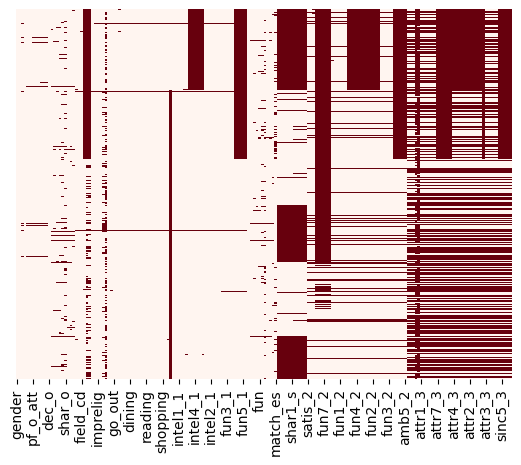

In [ ]:
# Missing data
missing_values = data.isnull()
sns.heatmap(data = missing_values.drop(columns = columns_ignore), yticklabels=False, cbar=False, cmap='Reds')

In [ ]:
# Sum
plt.bar([0], [calc_sum])
plt.title('Sum')

<Axes: >

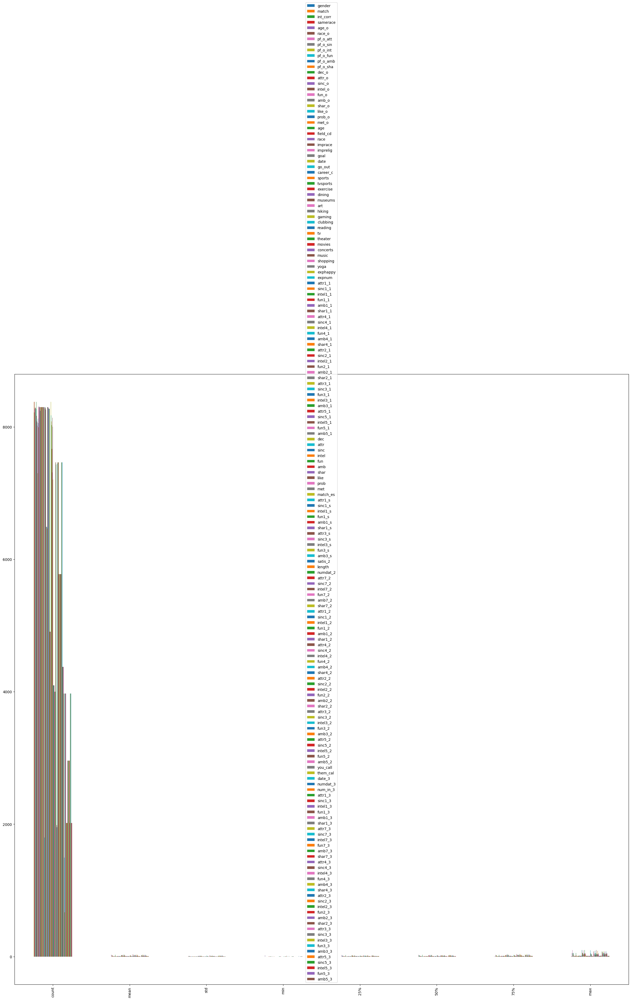

In [ ]:
descriptive_analysis.plot(kind='bar', figsize=(30, 30))

In [ ]:
plt.figure(figsize=(200, 200))

sns.violinplot(data=data.drop(columns = columns_ignore), inner="points")
plt.title('Data distribution')

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Exploratory data analysis
# Univariate analysis
intelligence_count = data['intel'].value_counts()

plt.figure(figsize=(10, 10))
plt.bar(intelligence_count.index, intelligence_count)
plt.title('Count Plot of Intelligence')
plt.xlabel('Intelligence')
plt.ylabel('Count')

In [ ]:
data.plot('age_o', 'match')

In [ ]:
#Importance of the racial/ethnic background by gender
groupbyGender = data.groupby(['gender']).sum()
groupbyGender.plot(kind='pie', y='imprace', autopct = "%.2f")
plt.legend(labels = ['Female', 'Male'])

In [ ]:
#Level of happiness expected on the other person by field
sns.barplot(x = 'field_cd', y = 'exphappy', errorbar = None, data = data)

<Axes: xlabel='race', ylabel='imprace'>

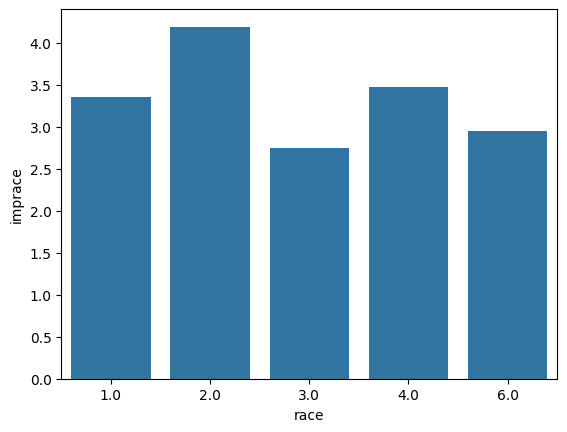

In [ ]:
sns.barplot(x='race', y='imprace', errorbar=None, data=data)

<Axes: title={'center': 'imprelig'}, xlabel='gender'>

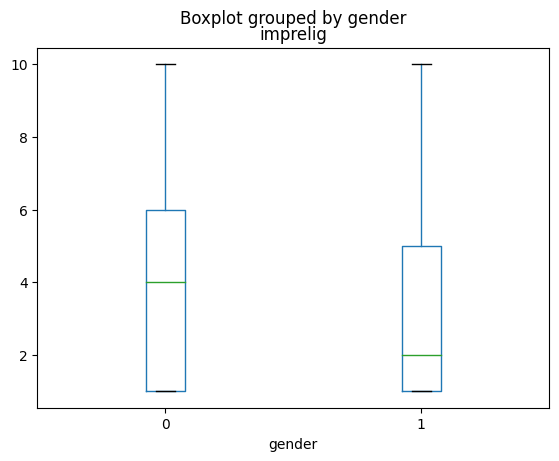

In [ ]:
data.boxplot(by = 'gender', column = ['imprelig'], grid = False)

In [ ]:
#Goal of the date by gender
data.boxplot(by = 'gender', column = ['goal'], grid = False)

In [ ]:
#Goal of the person related to his career
data.plot.scatter(x = 'goal', y = 'career_c')

**Limpieza de datos**

In [ ]:
# Duplicates
data = data.drop_duplicates()
print(data)

      iid    id  gender  idg  condtn  wave  round  position  positin1  order  \
0       1   1.0       0    1       1     1     10         7       NaN      4   
1       1   1.0       0    1       1     1     10         7       NaN      3   
2       1   1.0       0    1       1     1     10         7       NaN     10   
3       1   1.0       0    1       1     1     10         7       NaN      5   
4       1   1.0       0    1       1     1     10         7       NaN      7   
...   ...   ...     ...  ...     ...   ...    ...       ...       ...    ...   
8373  552  22.0       1   44       2    21     22        14      10.0      5   
8374  552  22.0       1   44       2    21     22        13      10.0      4   
8375  552  22.0       1   44       2    21     22        19      10.0     10   
8376  552  22.0       1   44       2    21     22         3      10.0     16   
8377  552   NaN       1   44       2    21     22         2      10.0     15   

      ...  attr3_3  sinc3_3  intel3_3  

In [ ]:
# Data type
print(data.dtypes)

iid           int64
id          float64
gender        int64
idg           int64
condtn        int64
             ...   
attr5_3     float64
sinc5_3     float64
intel5_3    float64
fun5_3      float64
amb5_3      float64
Length: 195, dtype: object


In [ ]:
# Count of missing values
missing = data.isnull().sum()
print(missing)

iid            0
id             1
gender         0
idg            0
condtn         0
            ... 
attr5_3     6362
sinc5_3     6362
intel5_3    6362
fun5_3      6362
amb5_3      6362
Length: 195, dtype: int64


In [ ]:
# Count of present values
present_values = data.notnull().sum()
print(present_values)

iid         8378
id          8377
gender      8378
idg         8378
condtn      8378
            ... 
attr5_3     2016
sinc5_3     2016
intel5_3    2016
fun5_3      2016
amb5_3      2016
Length: 195, dtype: int64


In [ ]:
# Number of unique values
unique_values = data.nunique()
print(unique_values)

iid         551
id           22
gender        2
idg          44
condtn        2
           ... 
attr5_3       9
sinc5_3       9
intel5_3      7
fun5_3       10
amb5_3        9
Length: 195, dtype: int64


**Detección y eliminación de ruido**

Tal como se ve en los resultados anteriores. Algunas columnas, no todas, poseen una gran cantidad de valores nulos. Las razones para esto pueden ser varias, como que en esa ronda el participante no haya estado presente, no haya respondido la pregunta dada o no ha haya comprendido, incluso que al momento de digitalizar los resultados no se haya pasado correctamente cada respuesta por errores humanos.

A continuación, veremos la distribución de algunas evaluaciones de atributos que poseen valores nulos, como la calificación de los atributos en la primera cita que poseen la siguiente cantidad de valores nulos

In [ ]:
cols = ["gender", "attr1_1", "sinc1_1", "intel1_1", "fun1_1", "amb1_1", "shar1_1"]
data[cols].isnull().sum()

gender        0
attr1_1      79
sinc1_1      79
intel1_1     79
fun1_1       89
amb1_1       99
shar1_1     121
dtype: int64

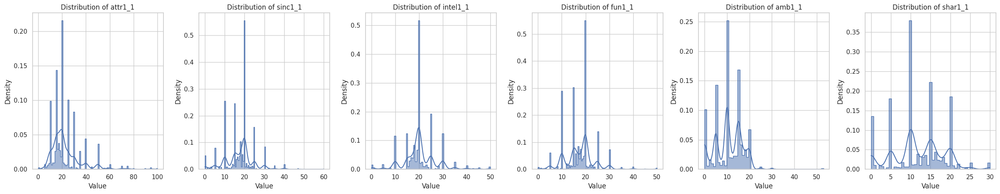

In [ ]:
sns.set(style = "whitegrid")

fig, axes = plt.subplots(nrows = 1, ncols = len(cols[1:]), figsize = (25, 5))

for i, column in enumerate(cols[1:]):
    sns.histplot(data[column], kde = True, ax = axes[i], element = "step", stat = "density", common_norm = False)
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Density')

plt.tight_layout()
plt.show()

In [ ]:
data[["gender", "attr1_1", "sinc1_1", "intel1_1", "fun1_1", "amb1_1", "shar1_1"]].describe(include = 'all')

,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1
count,8378.000000,8299.000000,8299.000000,8299.000000,8289.000000,8279.000000,8257.000000
mean,0.500597,22.514632,17.396389,20.265613,17.457043,10.682539,11.845111
std,0.500029,12.587674,7.046700,6.783003,6.085239,6.124888,6.362154
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,15.000000,15.000000,17.390000,15.000000,5.000000,9.520000
50%,1.000000,20.000000,18.180000,20.000000,18.000000,10.000000,10.640000
75%,1.000000,25.000000,20.000000,23.810000,20.000000,15.000000,16.000000
max,1.000000,100.000000,60.000000,50.000000,50.000000,53.000000,30.000000


Como se ve en estos gráficos, los datos no tienden a la normal sino que están siendo sesgados hacía la izquierda o hacía la derecha. Además, con la estadística descriptiva se observa que varios campos les faltan muchos datos que antes se observó que eran nulos.

Para completar esos valores nulos y reducir el ruido, se va a realizar una imputación de datos por medio del método de los K vecinos más cercanos

In [ ]:
imputer = KNNImputer(n_neighbors = 2)
KNN_imputation = imputer.fit_transform(data[cols])
print(KNN_imputation)

[[ 0. 15. 20. ... 15. 15. 15.]
 [ 0. 15. 20. ... 15. 15. 15.]
 [ 0. 15. 20. ... 15. 15. 15.]
 ...
 [ 1. 70.  0. ... 15.  0.  0.]
 [ 1. 70.  0. ... 15.  0.  0.]
 [ 1. 70.  0. ... 15.  0.  0.]]


In [ ]:
after_KNN = {}

for i in range(len(cols)):
  after_KNN[cols[i]] = []
  for j in range(len(KNN_imputation)):
     after_KNN[cols[i]].append(KNN_imputation[j][i])

In [ ]:
result_KNN = pd.DataFrame(after_KNN)
result_KNN.isnull().sum()

gender      0
attr1_1     0
sinc1_1     0
intel1_1    0
fun1_1      0
amb1_1      0
shar1_1     0
dtype: int64

Con la imputación de datos, se logran eliminar todos los registros vacíos que se encontraban en las columnas estudiadas. Hecho esto, volvemos a ver la distribución y estadística descriptiva de los datos

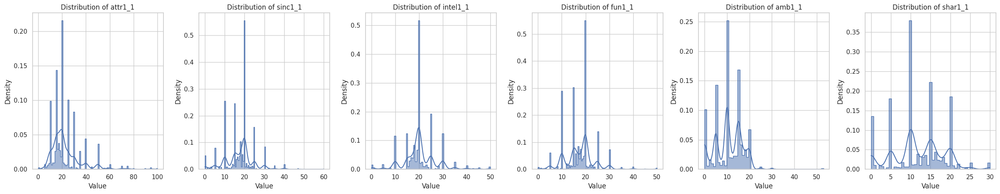

In [ ]:
sns.set(style="whitegrid")

fig, axes = plt.subplots(nrows = 1, ncols = len(cols[1:]), figsize = (25, 5))

for i, column in enumerate(cols[1:]):
    sns.histplot(data[column], kde = True, ax = axes[i], element = "step", stat = "density", common_norm = False)
    axes[i].set_title(f'Distribution of {column}')
    axes[i].set_xlabel('Value')
    axes[i].set_ylabel('Density')

plt.tight_layout()
plt.show()

In [ ]:
result_KNN.describe(include = 'all')

,gender,attr1_1,sinc1_1,intel1_1,fun1_1,amb1_1,shar1_1
count,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000,8378.000000
mean,0.500597,22.491517,17.420939,20.263108,17.436910,10.661941,11.797575
std,0.500029,12.558846,7.017907,6.750992,6.063056,6.143832,6.376829
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,15.000000,15.000000,17.650000,15.000000,5.000000,8.510000
50%,1.000000,20.000000,18.750000,20.000000,18.000000,10.000000,10.640000
75%,1.000000,25.000000,20.000000,23.260000,20.000000,15.000000,15.690000
max,1.000000,100.000000,60.000000,50.000000,50.000000,53.000000,30.000000


Como resultado de la eliminación de ruido, se observa que los datos estadísticos varían de forma poco significativa. Esto se observa por la baja variación en resultados como media, desviación estándar y los cuartiles. Esto también se puede observar en los gráficos de distribución donde se mantienen las curvas presentadas en estos campos antes de la imputación de datos.

Teniendo en cuenta que se añaden datos que permiten completar la información, se puede añadir cierto nivel de sesgo dado que se apoya de los resultados de otras personas del estudio. Aún así, con el sutil cambio en los resultados nos muestra que este ruido, visto en estos campos, no genera un gran impacto en el estudio puesto que la cantidad de datos alterados para completar la información no era una cantidad significativa.

Al contar con todos los campos llenos, es posible obtener mejores resultados y evitar problemas al hacer diferentes gráficos y estudios. Pero a grandes rasgos, no tienen gran efecto en los resultados posibles.

**Selección de características**

In [ ]:
attributes = ["attr", "sinc", "intel", "fun", "amb", "shar"]

attributes_mean = [data[x].mean() for x in attributes]
best_index = np.argmax(attributes_mean)
worst_index = np.argmin(attributes_mean)

attributes[best_index], attributes_mean[best_index], attributes[worst_index], attributes_mean[worst_index]

('intel', 7.368596881959911, 'shar', 5.474558883873615)

Tomando la puntuación sobre la importancia de cada atributo en su posible pareja, en escala de 1 a 10, vemos que:
* El mejor atributo es la inteligencia con una media de `7.37` puntos aproximadamente
* El peor atributo está los intereses o hobbies compartidos con una media de `5.47` puntos aproximadamente.

**Reporte de calidad de datos**

In [ ]:
#Check for duplicate rows
duplicate_rows = data[data.duplicated(keep=False)]

#Data types in the data
data_types = data.dtypes

#Metrics
metrics = pd.DataFrame({
        'Column': data.columns,
        'Data Type': data_types,
        'Missing Values': missing,
        'Unique Values': unique_values
    })

print("1. Información básica")
print(descriptive_analysis)
print("\n2. Datos faltantes por columna")
print(missing[missing > 0])
print("\n3. Filas duplicadas")
print(duplicate_rows)
print("\n4. Tipos de datos por columna")
print(data_types)
print("\n5. Cantidad de valores únicos por columna")
print(unique_values)
print("\n6. Métricas")
print(metrics)

1. Información básica
            gender        match     int_corr     samerace        age_o  \
count  8378.000000  8378.000000  8220.000000  8378.000000  8274.000000   
mean      0.500597     0.164717     0.196010     0.395799    26.364999   
std       0.500029     0.370947     0.303539     0.489051     3.563648   
min       0.000000     0.000000    -0.830000     0.000000    18.000000   
25%       0.000000     0.000000    -0.020000     0.000000    24.000000   
50%       1.000000     0.000000     0.210000     0.000000    26.000000   
75%       1.000000     0.000000     0.430000     1.000000    28.000000   
max       1.000000     1.000000     0.910000     1.000000    55.000000   

            race_o     pf_o_att     pf_o_sin     pf_o_int     pf_o_fun  ...  \
count  8305.000000  8289.000000  8289.000000  8289.000000  8280.000000  ...   
mean      2.756653    22.495347    17.396867    20.270759    17.459714  ...   
std       1.230689    12.569802     7.044003     6.782895     6.085526  ..

Con estos resultados y el reporte presentado, se puede observar que los datos cuentan con una calidad parcialmente buena.

Esto al contar con filas únicas en la totalidad de los datos y una buena cantidad de valores únicos, dada la categorización y respuesta de los participantes. A su vez, los datos de cada columna cumplen con el tipo indicado y suelen cumplir con el rango de respuesta establecido, brindando una buena consistencia de la información.

Esto puede apoyarse también con los gráficos presentados en secciones anteriores como el gráfico de violín y los boxplot, donde vemos la integridad de los datos y la presencia de pocos datos atípicos.

Adicinalmente, con los datos recolectados y los campos brindados, se pueden llegar a hacer buenas relaciones para el estudio. Ejemplos de esto fueron la importancia de la religión según el género, objetivo de la cita según la profesión y probabilidad de match según la edad de la otra persona.

Los datos faltantes podrían justificarse por la interacción de diferentes sujetos en cada iteración o sesión de citas rápidas.

**Distribución y comparación entre hombres y mujeres**

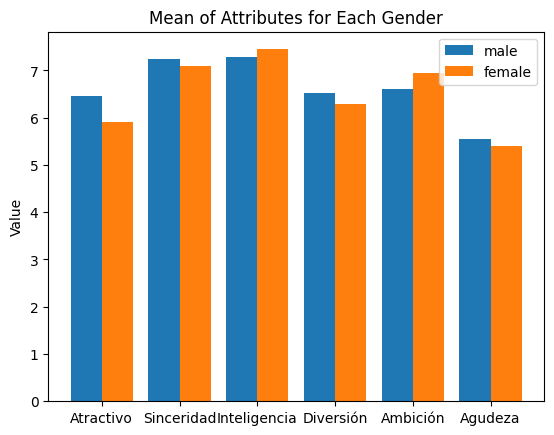

In [11]:
# Calculate mean of attributes for each gender
attributes = ['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']
gender = ['male', 'female']
results = []
for att in attributes:
    df_att = data.groupby('gender')[att].mean()
    df_att.name = att
    results.append(df_att)

# Combine results into one dataframe
result_df = pd.concat(results, axis=1)
result_df.rename(index={0:'female', 1:'male'}, inplace=True)

# Create a figure and axis
fig, ax = plt.subplots()

# Set the x-axis values as the attributes
x = np.arange(len(attributes))

# Create a bar for each gender
male_bar = ax.bar(x - 0.2, result_df.loc['male'], 0.4, label='male')
female_bar = ax.bar(x + 0.2, result_df.loc['female'], 0.4, label='female')

# Set the x-axis labels as the attributes
ax.set_xticks(x)
custom_labels = ['Atractivo', 'Sinceridad', 'Inteligencia', 'Diversión', 'Ambición', 'Agudeza']
ax.set_xticklabels(custom_labels)

# Set the y-axis label
ax.set_ylabel('Value')

# Set the title
ax.set_title('Mean of Attributes for Each Gender')

# Add a legend
ax.legend()

# Show the plot
plt.show()

**Predicción con regresión lineal o regresión logística**

In [27]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

data2 = pd.DataFrame(data[['match', 'attr', 'sinc', 'intel', 'fun', 'amb', 'shar']])
missing_values = data2.isnull().sum()

print(missing_values)
data2 = data2.dropna()

X = data2[['attr', 'sinc', 'intel', 'fun', 'amb', 'shar']]
y = data2['match']

X_train_df, X_test_df, y_train_df, y_test_df = train_test_split(X, y, test_size=0.3, random_state=101)


logreg = LogisticRegression(solver='lbfgs', max_iter=3000)
logreg.fit(X_train_df, y_train_df)
Y_pred = logreg.predict(X_test_df)
acc_log = round(logreg.score(X_train_df, y_train_df) * 100, 2)
print(acc_log)

match       0
attr      202
sinc      277
intel     296
fun       350
amb       712
shar     1067
dtype: int64
82.22


**Repartición de edad, campo de estudio, carrera y raza**

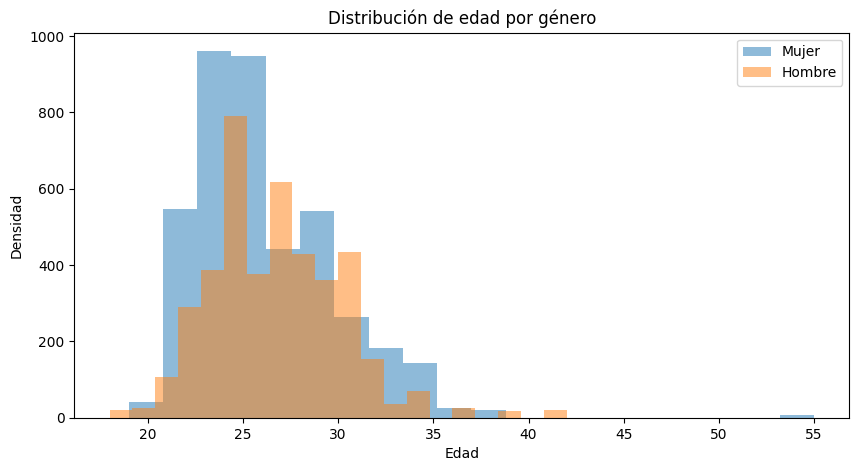

In [9]:
fig, axs = plt.subplots(1, 1, figsize=(10, 5))
for gender, group in data.groupby('gender'):
    axs.hist(group['age'], bins=20, alpha=0.5, label='Hombre' if gender == 1 else 'Mujer')
axs.set_xlabel('Edad')
axs.set_ylabel('Densidad')
axs.set_title('Distribución de edad por género')
axs.legend()
plt.show()

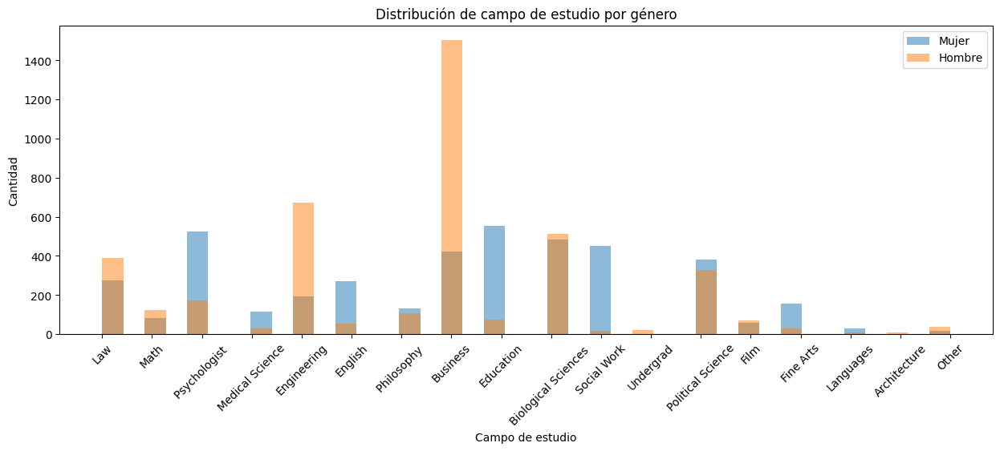

In [10]:
fig, axs = plt.subplots(1, 1, figsize=(15, 5))
for gender, group in data.groupby('gender'):
    axs.hist(group['field_cd'], bins=40, alpha=0.5, label='Hombre' if gender == 1 else 'Mujer')
axs.set_xlabel('Campo de estudio')
axs.set_ylabel('Cantidad')
axs.set_title('Distribución de campo de estudio por género')

# Cambiar la graduación del eje x
axs.set_xticks(range(1, 19))
axs.set_xticklabels(['Law', 'Math', 'Psychologist ', 'Medical Science', 'Engineering', 'English', 'Philosophy ', 'Business', 'Education', 'Biological Sciences ',
                     'Social Work', 'Undergrad', 'Political Science', 'Film', 'Fine Arts', 'Languages', 'Architecture', 'Other'])
axs.set_xticklabels(axs.get_xticklabels(), rotation=45)

axs.legend()
plt.show()

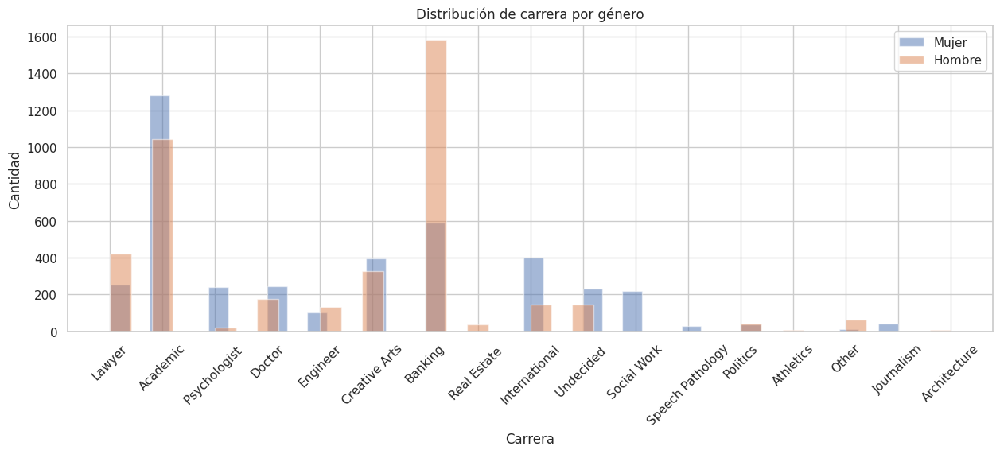

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(15, 5))
for gender, group in data.groupby('gender'):
    axs.hist(group['career_c'], bins=40, alpha=0.5, label='Hombre' if gender == 1 else 'Mujer')
axs.set_xlabel('Carrera')
axs.set_ylabel('Cantidad')
axs.set_title('Distribución de carrera por género')

# Cambiar la graduación del eje x
axs.set_xticks(range(1, 18))
axs.set_xticklabels(['Lawyer', 'Academic', 'Psychologist ', 'Doctor', 'Engineer', 'Creative Arts', 'Banking', 'Real Estate ', 'International', 'Undecided ', 'Social Work', 'Speech Pathology', 'Politics', 'Athletics', 'Other', 'Journalism', 'Architecture'])
axs.set_xticklabels(axs.get_xticklabels(), rotation=45)

axs.legend()
plt.show()

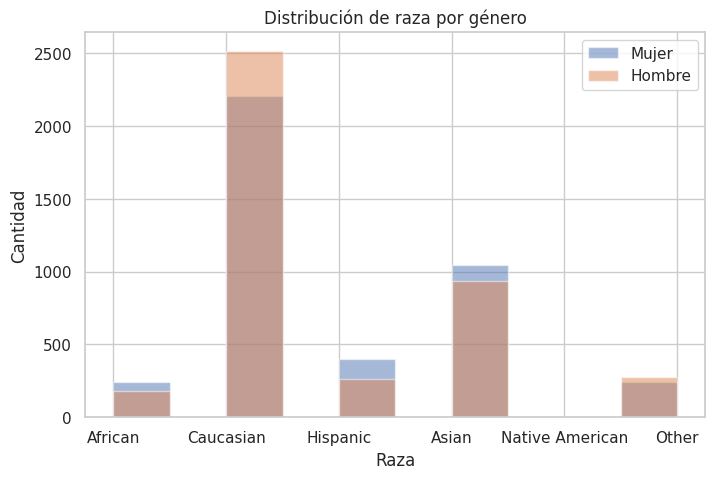

In [ ]:
fig, axs = plt.subplots(1, 1, figsize=(8, 5))
for gender, group in data.groupby('gender'):
    axs.hist(group['race'], bins=10, alpha=0.5, label='Hombre' if gender == 1 else 'Mujer')
axs.set_xlabel('Raza')
axs.set_ylabel('Cantidad')
axs.set_title('Distribución de raza por género')

# Cambiar la graduación del eje x
axs.set_xticks(range(1, 7))
axs.set_xticklabels(['African', 'Caucasian', 'Hispanic', 'Asian', 'Native American', 'Other'])

axs.legend()
plt.show()

**Preguntas y verificación de hipótesis**

**¿Qué influencia el amor a primera vista**

Para responder a esta pregunta, se analizan los datos recopilados para la primera cita del grupo de estudio. Con esto, buscamos analizar los atributos de mayor influencia en el primer encuentro.

In [ ]:
attributes_first_date = ["attr1_1", "sinc1_1", "intel1_1", "fun1_1", "amb1_1", "shar1_1"]

attr_first_date_mean = [data[x].mean() for x in attributes_first_date]

dictio = {}
for i in range(len(attributes_first_date)):
  dictio[attributes_first_date[i]] = attr_first_date_mean[i]

sorted(dictio.items(), key = lambda x : x[1], reverse = True)

Con los datos recopilados después de la primera cita, podemos notar que el atributo que tiene un mayor puntaje es el atractivo. Lo que representa que algo fundamental en la primera cita es el físico de la otra persona. Seguido por la inteligencia que posee una calificación promedio cercana al atractivo.

También se puede notar que las personas buscan en proporción similar que su posible pareja sea divertida y sincera.

Un aspecto con menor impacto según la calificación de esta primera cita fue el hecho de compartir intereses y pasatiempos con la otra persona.

Por último, la ambición no es un atributo determinante al calificar a la persona con la que tuvieron esta cita.

Ahora, analizaremos los datos tomados en la última cita para ver cómo cambió la perspectiva de las personas a medida que pasaban las rondas.

In [ ]:
attributes_last_date = ["attr1_3", "sinc1_3", "intel1_3", "fun1_3", "amb1_3", "shar1_3"]

attr_last_date_mean = [data[x].mean() for x in attributes_last_date]

dictio_last = {}
for i in range(len(attributes_last_date)):
  dictio_last[attributes_last_date[i]] = attr_last_date_mean[i]

sorted(dictio_last.items(), key = lambda x : x[1], reverse = True)

Con estos resultados, se observa que con el paso de las rondas no hubo cambios en lo que se buscaba en la otra persona. Es decir, que sus gustos no fueron afectados con el número de citas.

En conclusión, a primera vista lo más importante es el atractivo y lo menos relevante es la ambición. Esto, independiente a de qué género, raza, religión, edad y estudios tenga la persona, ya sea como evaluado o como evaluador.

**A**

1. **_¿Qué busca cada grupo en el sexo opuesto?_**

In [ ]:
att = data.groupby('gender')['attr', 'sinc', 'intel', 'fun', 'amb', 'shar'].sum()
att.plot(kind='pie', subplots = True, figsize = (20, 20), autopct = "%.2f")

Tal como se observó en el gráfico de la comparación entre hombres (naranja) y mujeres (azul). Vemos que en la mayoría de atributos, ambos géneros buscan de forma semejante los mismos atributos.

En el caso de los hombres, destaca su búsqueda por el atractivo y lo que menos les interesa es la ambición. En cambio, las mujeres buscan más la ambición y les interesa en menor medida el atractivo.

2. **_¿Cuál es el nivel de éxito contra el nivel de atractivo que buscan las personas en el sexo opuesto?_**

In [ ]:
correlation = data[['match', 'attr']].corr()
sns.heatmap(correlation, vmax = 0.9, square = True, annot = True, cmap = 'crest')

Con este mapa de calor, vemos que la relación entre el atractivo que se busca en la otra persona y la tasa de éxito, vista como obtener el match, es del 26%. Por lo cual, el hecho de buscar un nivel de atractivo en la otra persona no tiene un impacto significativo en la obtención del match durante la cita.

3. **_Cuál es el nivel de éxito contra el nivel de sinceridad que buscan las personas en el sexo opuesto?_**

In [ ]:
correlation = data[['match', 'sinc']].corr()
sns.heatmap(correlation, vmax = 0.9, square = True, annot = True, cmap = 'Blues')

En este mapa de calor, se observa la relación existente entre la sinceridad buscada en la otra persona ante la tasa de éxito o de match es del 16%. Lo cual muestra que, hay un vínculo débil entre la búsqueda de sinceridad en su pareja y la probabilidad de hacer match.

Esto se relaciona con los análisis presentados anteriormente donde se ve que la sinceridad no es un atributo de gran relevancia.

4. **_Cuál es el nivel de éxito contra el nivel de inteligencia que buscan las personas en el sexo opuesto?_**

In [ ]:
correlation = data[['match', 'intel']].corr()
sns.heatmap(correlation, vmax = 0.9, square = True, annot = True, cmap = sns.cubehelix_palette(as_cmap=True))

En este mapa de calor, se observa la relación existente entre la inteligencia buscada en la otra persona ante la tasa de éxito o de match es del 17%. Lo cual muestra que, hay un vínculo débil entre la búsqueda de inteligencia en su pareja y la probabilidad de hacer match.

Esto nos muestra que, a pesar de que la inteligencia tenga una alta relevancia al momento de buscar pareja, no influye directamente en la obtención del match.

**B**

1. _Las personas con mejor atractivo son más deseables_
2. _Las personas con mejor inteligencia son más deseables_

Como se vio en los análisis de la evaluación de los atributos de las citas, factores como el atractivo y la inteligencia son características que destacan y son más deseados por ambos géneros en la primera cita.

Teniendo los promedios más altos, tanto en hombres y mujeres sin importar sus características principales como raza, carrera, ciudad, etc.